First Step Is to Link the Google Drive to the the Colab Repository

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Correct Path Upto 'object_detection' directory in your Drive

In [0]:
import os
os.chdir('/content/drive/My Drive/Tensorflow/models/research/object_detection/')

Importing Required Libraries and Modeules


In [4]:
import os
import cv2
import numpy as np
import tensorflow as tf
import sys
sys.path.append("..")
from utils import label_map_util
from utils import visualization_utils as vis_util

Replace 'DC_MODEL_NAME' with the pre-trained model's directory name which was pasted in the object detection Directory.

In [0]:
MODEL_NAME = 'DC_MODEL_NAME'

List of Test Images in DC_test Directory

In [0]:
LIST_TEST_IMG = os.listdir(os.path.join(os.getcwd(),"DC_test"))

Function for Running Object Detection Model On Test Images

In [0]:
# Grab path to current working directory
CWD_PATH = os.getcwd()

def Tester(PATH_TO_IMAGE) :
  # Path to frozen detection graph .pb file, which contains the model that is used

  # for object detection.

  PATH_TO_CKPT = os.path.join(CWD_PATH,MODEL_NAME,'frozen_inference_graph.pb')

  # Path to label map file

  PATH_TO_LABELS = os.path.join(CWD_PATH,'training','labelmap1.pbtxt')

  # Number of classes the object detector can identify

  NUM_CLASSES = 90

  # Load the label map.

  # Label maps map indices to category names, so that when our convolution

  # network predicts `5`, we know that this corresponds to `king`.

  # Here we use internal utility functions, but anything that returns a

  # dictionary mapping integers to appropriate string labels would be fine

  label_map = label_map_util.load_labelmap(PATH_TO_LABELS)

  categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)

  category_index = label_map_util.create_category_index(categories)

  # Load the Tensorflow model into memory.

  detection_graph = tf.Graph()

  with detection_graph.as_default():

      od_graph_def = tf.GraphDef()

      with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:

          serialized_graph = fid.read()

          od_graph_def.ParseFromString(serialized_graph)

          tf.import_graph_def(od_graph_def, name='')

      sess = tf.Session(graph=detection_graph)

  # Define input and output tensors (i.e. data) for the object detection classifier

  # Input tensor is the image

  image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

  # Output tensors are the detection boxes, scores, and classes

  # Each box represents a part of the image where a particular object was detected

  detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

  # Each score represents level of confidence for each of the objects.

  # The score is shown on the result image, together with the class label.

  detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')

  detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

  # Number of objects detected

  num_detections = detection_graph.get_tensor_by_name('num_detections:0')

  # Load image using OpenCV and

  # expand image dimensions to have shape: [1, None, None, 3]

  # i.e. a single-column array, where each item in the column has the pixel RGB value

  image = cv2.imread(PATH_TO_IMAGE)

  image_expanded = np.expand_dims(image, axis=0)

  # Perform the actual detection by running the model with the image as input

  (boxes, scores, classes, num) = sess.run(

      [detection_boxes, detection_scores, detection_classes, num_detections],

      feed_dict={image_tensor: image_expanded})

  # Draw the results of the detection (aka 'visulaize the results')

  vis_util.visualize_boxes_and_labels_on_image_array(

      image,

      np.squeeze(boxes),

      np.squeeze(classes).astype(np.int32),

      np.squeeze(scores),

      category_index,

      use_normalized_coordinates=True,

      line_thickness=8,

      min_score_thresh=0.50)

  # All the results have been drawn on image. Now display the image.

  from google.colab.patches import cv2_imshow

  cv2_imshow(image)

  # Press any key to close the image

  cv2.waitKey(0)

  # Clean up

  cv2.destroyAllWindows()

Iterating Through the Test Images and Running Model On Them 

/content/drive/My Drive/Tensorflow/models/research/object_detection/DC_test/aloo.jpg



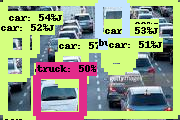

/content/drive/My Drive/Tensorflow/models/research/object_detection/DC_test/carrr.jpg


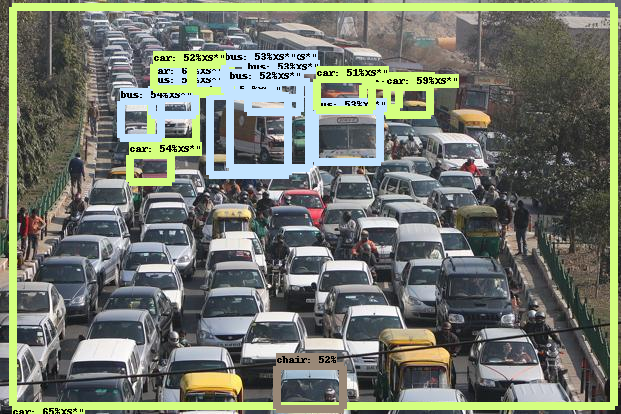

/content/drive/My Drive/Tensorflow/models/research/object_detection/DC_test/bira.jpeg


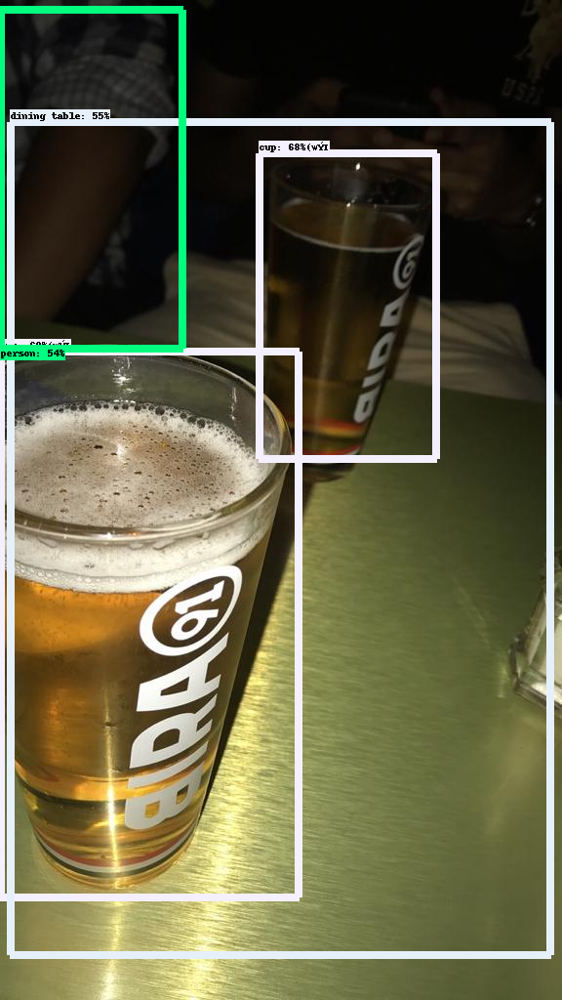

/content/drive/My Drive/Tensorflow/models/research/object_detection/DC_test/DC1.jpeg


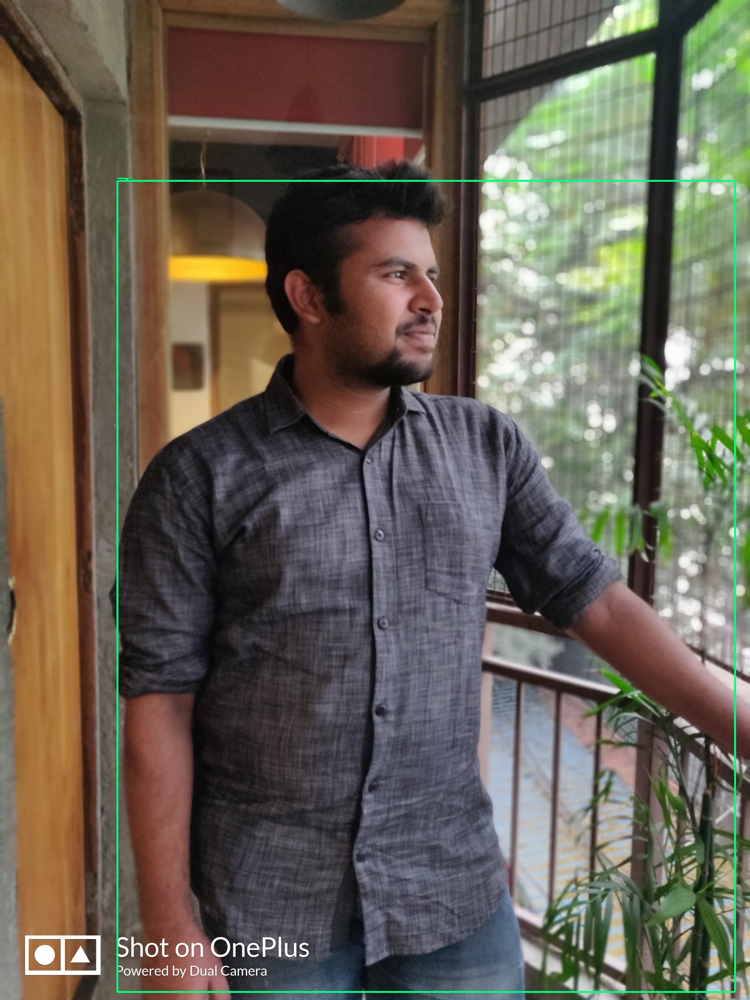

In [11]:
for test_img in LIST_TEST_IMG :
  print(os.path.join(CWD_PATH, "DC_test", test_img))
  PATH_TO_IMAGE = os.path.join(CWD_PATH, "DC_test", test_img)
  Tester(PATH_TO_IMAGE)